In [1]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

import torch

c:\Users\Sam\miniconda3\envs\wisp1\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
images = '../datasets/greendino_new/images/'
depth = '../datasets/greendino_new/depths/'

In [3]:
i=np.random.randint(0,len(os.listdir(images)),(1,))
name = os.listdir(images)[i.item()]
img = cv2.imread(images+name)
dpt = cv2.imread(depth+name.replace('.jpg','.png'), cv2.IMREAD_GRAYSCALE)

111.0


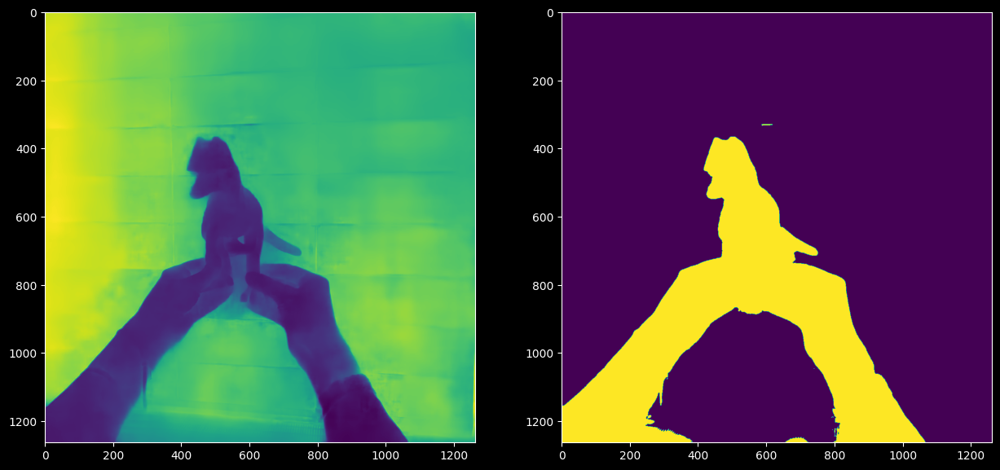

In [4]:
T, _ = cv2.threshold(dpt, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
print(T)
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
plt.imshow(dpt)
plt.subplot(1,2,2)
plt.imshow(dpt<T+25)

(1263, 1263)

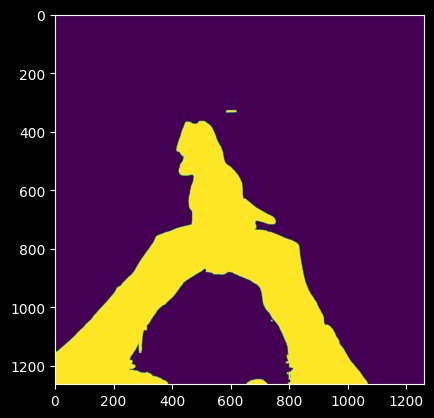

In [5]:
mask=(dpt<(T+25))
kernel=np.ones((5,5))
d=cv2.dilate(mask*1., kernel, iterations=1).astype(int)
plt.imshow(d)
d.shape

In [6]:
gray= cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
sift = cv2.SIFT_create()
#kp = sift.detect(gray,None)
kps, des = sift.detectAndCompute(gray,None)
img_sf=cv2.drawKeypoints(gray,kps,img)

In [7]:
img.dtype

dtype('uint8')

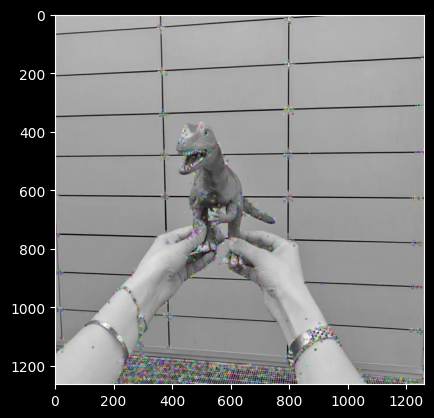

In [8]:
plt.imshow(img_sf)

In [9]:
len(kps), len(des)

(3412, 3412)

In [10]:
pts=np.array([kp.pt for kp in kps])
pts.shape

(3412, 2)

In [11]:
des.shape

(3412, 128)

In [12]:
from extensions.dataset import DatasetLoader, MyDataset, NeRFSyntheticDataset
loader = DatasetLoader()

In [13]:
dataset_path='../datasets/yellowdino_new_new/'
data = loader.load(dataset_path, mip=1, with_mask=True, with_depth=True, dataset_num_workers=0)

loading data: 100%|██████████| 120/120 [00:06<00:00, 18.54it/s]


In [14]:
centers=torch.randn_like(data['cameras']['poses'][:,:-1,-1])
centers=centers/centers.norm(dim=1)[:,None]

third_dir = centers # make them point to the center
first_dir = torch.randn_like(data['cameras']['poses'][:,:-1,0])
first_dir = first_dir-third_dir*(third_dir[:,None]@first_dir[...,None])[:,0]
first_dir = first_dir/first_dir.norm(dim=1)[:,None]
second_dir = torch.cross(third_dir,first_dir, dim=1)

pos = torch.stack([first_dir,second_dir,third_dir,centers],2) #last row is useless

In [15]:
data['cameras']['fx'] = torch.tensor(data['cameras']['width']).float()
data['cameras']['fy'] = torch.tensor(data['cameras']['height']).float()
data['cameras']['cx'] = data['cameras']['width']/2
data['cameras']['cy'] = data['cameras']['height']/2
data['cameras']['poses'] = pos

from extensions.cameras import Cameras

cams = Cameras(**data['cameras'], trainable=True)

d:\Scuola\02_UniBo\2_anno\ML4CV\instantNeRFW\new\extensions\cameras.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.fx = torch.nn.Parameter(torch.tensor(fx),trainable)
d:\Scuola\02_UniBo\2_anno\ML4CV\instantNeRFW\new\extensions\cameras.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.fy = torch.nn.Parameter(torch.tensor(fy),trainable)
d:\Scuola\02_UniBo\2_anno\ML4CV\instantNeRFW\new\extensions\cameras.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.poses = torch.nn.Parameter(torch.tensor(poses),trainable)


In [16]:
from extensions.dataset import DatasetLoader, MyDataset
train_dataset = MyDataset(data['rgb'], mask=data['masks'], depth=data['depths'], rays_per_sample=2**14)


In [17]:
point, pos_x, pos_y, idx = train_dataset.__getitem__(0)

In [18]:
rays = cams.get_rays(idx.cpu(), pos_x.cpu(), pos_y.cpu())

In [19]:
pts_3d = rays.origins + rays.dirs * (3*(point['depth'].cpu())+2).clip(0,10)

import plotly.graph_objects as go
pts= pts_3d.detach().cpu()

layout = go.Layout(
    autosize=False,
    width=800,
    height=800
)

fig = go.Figure(data=[go.Scatter3d(x=pts[:,0],
                        y=pts[:,1],
                        z=pts[:,2], 
                        mode='markers',
                        marker=dict(
                            size=1,
                            color=point['rgb'].cpu(),                # set color to an array/list of desired values
                            # colorscale='Viridis',   # choose a colorscale
                            # opacity=0.8
                        )
                    )],
                    layout=layout)
fig.show()

In [20]:
rays = cams.get_rays(idx.cpu(), pos_x.cpu(), pos_y.cpu())

pts_3d = rays.origins + rays.dirs * (1/(1-point['depth'].cpu())).clip(0,3)

import plotly.graph_objects as go
pts= pts_3d.detach().cpu()

layout = go.Layout(
    autosize=False,
    width=800,
    height=800
)

fig = go.Figure(data=[go.Scatter3d(x=pts[:,0],
                        y=pts[:,1],
                        z=pts[:,2], 
                        mode='markers',
                        marker=dict(
                            size=1,
                            color=point['rgb'].cpu(),                # set color to an array/list of desired values
                            # colorscale='Viridis',   # choose a colorscale
                            # opacity=0.8
                        )
                    )],
                    layout=layout)
fig.show()

In [21]:
cams.get_rays(torch.tensor([0]),torch.tensor(0)[None],torch.tensor(0)[None])

Rays(origins=tensor([[-0.5171, -0.8304, -0.2073]], grad_fn=<IndexBackward0>), dirs=tensor([[ 0.6826,  0.6443, -0.3449]], grad_fn=<DivBackward0>), dist_min=0, dist_max=6)

In [22]:
KP=[]

for i, (img, depth, mask) in enumerate(zip(data['rgb'],data['depths'],data['masks'])):
    gray= cv2.cvtColor((img*255).to(torch.uint8).numpy(),cv2.COLOR_BGR2GRAY)
    kps, des = sift.detectAndCompute(gray,None)
    pts=np.array([kp.pt for kp in kps])
    pts=pts.round().astype(int)
    
    m=mask[pts.T]
    c=img[pts.T][(m>0)[:,0]]
    d=depth[pts.T][(m>0)[:,0]]
    des=des[(m>0)[:,0]]
    pts=pts[(m>0)[:,0]]

    KP.append(np.concatenate([np.full_like(d,i),pts,d,c,des/256],1))

KP = np.concatenate(KP,0)
KP = np.concatenate([np.arange(len(KP))[:,None],KP],1)
KP.shape


(24331, 136)

In [23]:
from torch.utils.data import DataLoader

train_dataloader = DataLoader(torch.tensor(KP), batch_size=2048, shuffle=True, pin_memory=True)

In [24]:
transf_cam = torch.zeros((len(cams),2), requires_grad=True)
transf_pts = torch.zeros((len(KP),2), requires_grad=True)

with torch.no_grad():
    transf_cam[:,0] = 1
    transf_pts[:,0] = 1

In [25]:
opt = torch.optim.Adam(list(cams.parameters())+[transf_cam, transf_pts])
LH=[]

In [26]:
device='cuda'

In [27]:
def get_3d_pts(batch):
    
    p_idx = batch[:,0]
    c_idx = batch[:,1]
    pts = batch[:,2:4]
    depth = 1/(1-batch[:,4])

    rays = cams.get_rays(c_idx.long(),pts[:,1].long(),pts[:,0].long())

    depth_pts = ( depth     * transf_pts[p_idx.long(),0] + transf_pts[p_idx.long(),1] )
    depth_cam = ( depth_pts * transf_cam[c_idx.long(),0] + transf_cam[c_idx.long(),1] )
    pts_3d = rays.origins + rays.dirs * depth_cam[:,None]
    return pts_3d

In [28]:
# epochs=1000
# for e in range(epochs):


#     for batch in train_dataloader:

#         batch.to(device, non_blocking=True)

#         opt.zero_grad()

        
#         print(batch.shape)
#         pts_3d = get_3d_pts(batch)
#         print(pts_3d.shape)

#         c_idx = c_idx.reshape(-1,2)
#         indices = c_idx[:,0]!=c_idx[:,1]

#         pts_3d=pts_3d.reshape(-1,2,3)
#         rgb = batch[:,5:8].reshape(-1,2,3)
#         sift = batch[:,8:].reshape(-1,2,128)

#         dists_col = (rgb[:,0]-rgb[:,1]).norm(dim=1)
#         dists_fts = (sift[:,0]-sift[:,1]).norm(dim=1)

#         weights = torch.exp(-torch.stack([dists_col*1, dists_fts*2],1).norm(dim=1)*0.1)
        
#         dists_pts = (pts_3d[:,0]-pts_3d[:,1]).norm(dim=1)

#         loss = (dists_pts*weights)[indices].sum()/len(indices)
#         loss += (transf_pts[p_idx.long()]-torch.tensor([1,0])).square().mean()*10
#         loss += (transf_cam[c_idx.long()]-torch.tensor([1,0])).square().mean()*0.1

#         loss.backward()

#         opt.step()

#         LH.append(loss.item())

#         print(e, loss.item(),end='\r')

    

In [29]:
from pytorch3d.ops.knn import knn_points

In [30]:
i=0
j=1

KP=torch.tensor(KP).float()

points_i=KP[KP[:,1]==i]
points_j=KP[KP[:,1]==j]

In [31]:
results = knn_points(points_i[None],points_j[None])

In [32]:
from extensions.chamfer_distance import chamfer_distance

In [33]:
epochs = 10000

for e in range(epochs):

    opt.zero_grad()

    i=torch.randint(0,len(cams),(1,))
    j=torch.randint(0,len(cams)-1,(1,))
    if j>=i:
        j += 1

    points_i=KP[KP[:,1]==i]
    points_j=KP[KP[:,1]==j]

    #pts_3d_i = get_3d_pts(points_i)
    batch = points_i
    p_idx = batch[:,0]
    c_idx = batch[:,1]
    pts = batch[:,2:4]
    depth = 1/(1-batch[:,4])

    rays = cams.get_rays(c_idx.long(),pts[:,1].long(),pts[:,0].long())

    depth_pts = ( depth     * transf_pts[p_idx.long(),0] + transf_pts[p_idx.long(),1] )
    depth_cam = ( depth_pts * transf_cam[c_idx.long(),0] + transf_cam[c_idx.long(),1] )
    pts_3d_i = rays.origins + rays.dirs * depth_cam[:,None]
    
    #pts_3d_j = get_3d_pts(points_j)
    batch = points_j
    p_idx = batch[:,0]
    c_idx = batch[:,1]
    pts = batch[:,2:4]
    depth = 1/(1-batch[:,4])

    rays = cams.get_rays(c_idx.long(),pts[:,1].long(),pts[:,0].long())

    depth_pts = ( depth     * transf_pts[p_idx.long(),0] + transf_pts[p_idx.long(),1] )
    depth_cam = ( depth_pts * transf_cam[c_idx.long(),0] + transf_cam[c_idx.long(),1] )
    pts_3d_j = rays.origins + rays.dirs * depth_cam[:,None]

    rgb_i = points_i[:,5:8]
    rgb_j = points_j[:,5:8]
    
    sift_i = points_i[:,8:]
    sift_j = points_j[:,8:]

    pc_i = torch.concat([rgb_i/10, sift_i], 1)
    pc_j = torch.concat([rgb_j/10, sift_j], 1)

    d1, d2, idx1, idx2 = chamfer_distance(pc_i[None], pc_j[None])


    dist_i = (pts_3d_i - pts_3d_j[idx1[0]]).norm(dim=1)
    dist_j = (pts_3d_j - pts_3d_i[idx2[0]]).norm(dim=1)
    
    loss = (dist_i/d1).mean() + (dist_j/d2).mean()

    loss += (cams.fx-cams.width).square() + (cams.fy-cams.height).square()
    loss += (cams.cx-cams.width/2).square() + (cams.cy-cams.height/2).square()
    
    
    loss.backward()

    opt.step()

    LH.append(loss.item())
    
    print(e, loss.item(),end='\r')

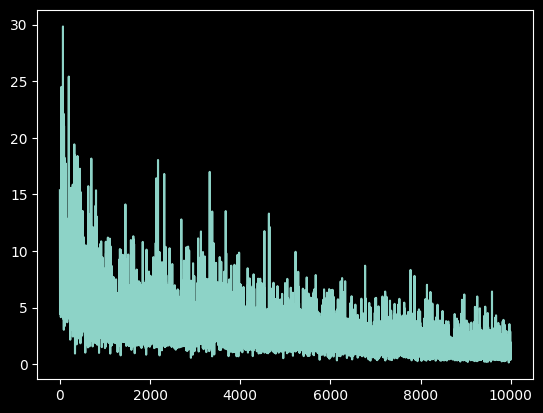

In [34]:
plt.plot(LH)

In [35]:
cams.get_rays(i,torch.tensor(600)[None],torch.tensor(600)[None])

Rays(origins=tensor([[-0.0551,  0.8869,  0.3567]], grad_fn=<IndexBackward0>), dirs=tensor([[ 0.4639, -0.8830, -0.0713]], grad_fn=<DivBackward0>), dist_min=0, dist_max=6)

In [36]:
cams.get_rays(i,torch.tensor(0)[None],torch.tensor(0)[None])

Rays(origins=tensor([[-0.0551,  0.8869,  0.3567]], grad_fn=<IndexBackward0>), dirs=tensor([[-0.3602, -0.6028, -0.7120]], grad_fn=<DivBackward0>), dist_min=0, dist_max=6)

In [37]:
import plotly.graph_objects as go
data= pts_3d_i.detach().cpu()
fig = go.Figure(data=[go.Scatter3d(x=data[:,0],
                        y=data[:,1],
                        z=data[:,2], 
                        mode='markers',
                        marker=dict(
                            size=1,
                            color=rgb_i,                # set color to an array/list of desired values
                            # colorscale='Viridis',   # choose a colorscale
                            # opacity=0.8
                        )
                    )])
fig.show()

In [38]:
rays = cams.get_rays(idx.cpu(), pos_x.cpu(), pos_y.cpu())

pts_3d = rays.origins + rays.dirs * (1/(1-point['depth'].cpu())).clip(0,3)

import plotly.graph_objects as go
pts= pts_3d.detach().cpu()

layout = go.Layout(
    autosize=False,
    width=800,
    height=800
)

fig = go.Figure(data=[go.Scatter3d(x=pts[:,0],
                        y=pts[:,1],
                        z=pts[:,2], 
                        mode='markers',
                        marker=dict(
                            size=1,
                            color=point['rgb'].cpu(),                # set color to an array/list of desired values
                            # colorscale='Viridis',   # choose a colorscale
                            # opacity=0.8
                        )
                    )],
                    layout=layout)
fig.show()

In [44]:
cams.cx

Parameter containing:
tensor(312.9994, requires_grad=True)

In [45]:
cams.height

626